In [2]:
import numpy as np
import sys
import matplotlib.pyplot as plt
import 


In [3]:
class traj:
    def __init__(self, box_size, positions,velocities,types):
        self.box_size =box_size
        self.positions=positions
        self.velocities=velocities
        self.types=types
        


In [4]:
a=traj(box_size=1,positions=1,velocities=1,types=1)

In [9]:
def read_lammpstrj(filename,N_particles,N_start,N_end):
    n_timestep=N_end-N_start
    box_size=np.zeros((n_timestep+1,3))
    positions=np.zeros((n_timestep+1,N_particles,3))
    velocities=np.zeros((n_timestep+1,N_particles,3))
    types=np.zeros((n_timestep+1,N_particles))
    count = 0

    with open(filename, 'rb') as f:
        for line in f:
            n_t=int(count/(N_particles+9))
            if n_t<N_start:
                count+=1
                continue
            if n_t>N_end:
                  break
            separate=line.split()
            if count%(9+N_particles)==5:
                box_size[n_t-N_start][0]=float(separate[1])-float(separate[0])
            if count%(9+N_particles)==6:
                box_size[n_t-N_start][1]=float(separate[1])-float(separate[0])
            if count%(9+N_particles)==7:
                box_size[n_t-N_start][2]=float(separate[1])-float(separate[0])
            if count%(9+N_particles)>=9:
                n_p=int(separate[0])-1
                types[n_t-N_start][n_p]=float(separate[2])
                positions[n_t-N_start][n_p][0]=float(separate[4])
                positions[n_t-N_start][n_p][1]=float(separate[5])
                positions[n_t-N_start][n_p][2]=float(separate[6])
                velocities[n_t-N_start][n_p][0]=float(separate[7])
                velocities[n_t-N_start][n_p][1]=float(separate[8])
                velocities[n_t-N_start][n_p][2]=float(separate[9])
            count+=1
    return traj(box_size=box_size,positions=positions,velocities=velocities,types=types)

In [10]:
a=read_lammpstrj('gel.lammpstrj',10000,100,1000)

In [17]:
a.types[:,9000:10000]

array([[5., 5., 5., ..., 5., 5., 5.],
       [5., 5., 5., ..., 5., 5., 5.],
       [5., 5., 5., ..., 5., 5., 5.],
       ...,
       [5., 5., 5., ..., 5., 5., 5.],
       [5., 5., 5., ..., 5., 5., 5.],
       [5., 5., 5., ..., 5., 5., 5.]])

In [14]:
positions=a.positions

velocities=a.velocities




In [15]:
ion_velocity=velocities[:,9000:10000,:]

In [22]:
ion_velocity[700:].mean()

-0.17231901448233966

In [84]:
small_velocities[1*100:1*100+100,:,0].mean()

1.5350383684278657

In [85]:
vxsmall_set=[]
for i in range(0,10):
    vxsmall_set.append(small_velocities[i*100+8900:i*100+9900,:,0].mean())

In [86]:
np.array(vxsmall_set).std()

0.0004991956127948781

In [87]:
np.array(vxsmall_set).mean()

1.5317142914182444

In [88]:
vxsmall_set

[1.5317381470481655,
 1.5314716869548983,
 1.5324905641112927,
 1.531725018635965,
 1.532260871684166,
 1.5319666111212877,
 1.5315707611304705,
 1.532029321668635,
 1.5312311813300445,
 1.5306587504975213]

In [29]:
for i in range(0,10,2):
    a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun1.%d0.lammpstrj'%(i),5200,9000,10000)
    positions=a.positions
    small_positions=a.positions[:,400:5200,0:2]
    large_positions=a.positions[:,0:400,0:2]
    velocities=a.velocities
    small_velocities=velocities[:,400:5200,0:2]
    large_velocities=velocities[:,0:400,0:2]
    vxsmall_set=[]
    for j in range(0,10):
        vxsmall_set.append(small_velocities[j*100:j*100+100,:,0].mean())
    print(np.array(vxsmall_set).std())
    print(np.array(vxsmall_set).mean())
    print(vxsmall_set)

0.0025541936572512657
1.5313324202295773
[1.5323449154164837, 1.5325373629699548, 1.5290492055637104, 1.5335585186909912, 1.5270131315041113, 1.5308731519532282, 1.5339231148966874, 1.5330238633261897, 1.5271263551394136, 1.5338745828350036]
0.004787405184958262
1.8910844949763035
[1.8886489394444248, 1.898796661063036, 1.8992859526053023, 1.886370773275908, 1.8876350491861464, 1.8907319977638193, 1.894265694087455, 1.89246269093983, 1.8847543185187714, 1.8878928728783426]
0.004865419104115463
2.2496818678495085
[2.2501855584947825, 2.240990929988019, 2.2514316222182553, 2.2475132540840663, 2.253491877067693, 2.250872159652002, 2.2504629429471152, 2.2419579768405153, 2.2516901292955107, 2.2582222279071265]
0.0019614304628415256
2.6128606384485793
[2.6113311759321776, 2.611818433960903, 2.614507398531016, 2.6130701096452813, 2.6173489494223756, 2.6136265836906647, 2.611916544390614, 2.6107899230685803, 2.610483259321396, 2.6137140065227835]
0.00358875129759807
2.9752785723289996
[2.9673

In [30]:
for i in [2,10]:
    a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun%d.00.lammpstrj'%(i),5200,9000,10000)
    positions=a.positions
    small_positions=a.positions[:,400:5200,0:2]
    large_positions=a.positions[:,0:400,0:2]
    velocities=a.velocities
    small_velocities=velocities[:,400:5200,0:2]
    large_velocities=velocities[:,0:400,0:2]
    vxsmall_set=[]
    for j in range(0,10):
        vxsmall_set.append(small_velocities[j*100:j*100+100,:,0].mean())
    print(np.array(vxsmall_set).std())
    print(np.array(vxsmall_set).mean())
    print(vxsmall_set)

0.0029649532492867134
3.339655817214551
[3.3398096740636096, 3.336762954896519, 3.3432550136332884, 3.339963191319693, 3.3408382113298805, 3.336107611598085, 3.341227303646919, 3.333896914990078, 3.343431107901265, 3.3412661887661725]
0.011592156059713385
17.882868274857252
[17.891015604567293, 17.89127109379021, 17.895119934678807, 17.895284507768753, 17.890113064907705, 17.884262363246247, 17.88171443210126, 17.87241510998083, 17.865471048526047, 17.86201558900536]


In [31]:
for i in [5,6,7,8,9]:
    a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun_2%d.00.lammpstrj'%(i),5200,14000,15000)
    positions=a.positions
    small_positions=a.positions[:,400:5200,0:2]
    large_positions=a.positions[:,0:400,0:2]
    velocities=a.velocities
    small_velocities=velocities[:,400:5200,0:2]
    large_velocities=velocities[:,0:400,0:2]
    vxsmall_set=[]
    for j in range(0,10):
        vxsmall_set.append(small_velocities[j*100:j*100+100,:,0].mean())
    print(np.array(vxsmall_set).std())
    print(np.array(vxsmall_set).mean())
    print(vxsmall_set)

0.004880841388013599
8.912292317695659
[8.912664252869591, 8.914443714474936, 8.909714527786107, 8.913578490440214, 8.909817645723322, 8.908656520532505, 8.906689761194492, 8.925318508936392, 8.910151397951502, 8.911888357047534]
0.0037675993747661903
10.779683930672546
[10.78350648622858, 10.784070217160416, 10.780191934424689, 10.775262170567354, 10.784896707747064, 10.78149402128689, 10.780078756728958, 10.774243327943685, 10.774497115464573, 10.77859856917325]
0.0024558493770305448
12.624324617924927
[12.624814907408753, 12.626154738643333, 12.625835539975627, 12.62361097761334, 12.625838075164372, 12.623144439199997, 12.622795246223335, 12.629012817197083, 12.62244866751759, 12.619590770305829]
0.0028405769787745875
14.448799118194898
[14.449366212213537, 14.45013208336687, 14.448399918581876, 14.451866168980624, 14.44856487854875, 14.448572258402498, 14.443531281891246, 14.445063073361668, 14.44848911103479, 14.45400619556709]
0.0031947758668876454
16.187783877675823
[16.18919446

In [32]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun.01.lammpstrj',5200,9000,10000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]
for j in range(0,10):
    vxsmall_set.append(small_velocities[j*100:j*100+100,:,0].mean())
print(np.array(vxsmall_set).std())
print(np.array(vxsmall_set).mean())
print(vxsmall_set)

0.002001658340517281
0.011639695908744946
[0.008167875866302002, 0.01084620762562795, 0.013648918123246812, 0.013688211522901688, 0.012635840044148187, 0.01183128308250292, 0.01193637143027537, 0.01397533268763946, 0.008093831860121874, 0.01157308684468319]


In [33]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun.10.lammpstrj',5200,9000,10000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]
for j in range(0,10):
    vxsmall_set.append(small_velocities[j*100:j*100+100,:,0].mean())
print(np.array(vxsmall_set).std())
print(np.array(vxsmall_set).mean())
print(vxsmall_set)

0.0020212101533828237
0.1067185361658809
[0.10552966403157145, 0.10658893958740566, 0.10798550940852417, 0.1037289309078879, 0.10593963599625175, 0.1105242693417619, 0.10928929328650122, 0.10509537580828394, 0.10768547690318878, 0.10481826638743225]


In [34]:
a=read_lammpstrj('electric_field_langevin_large_small_att_norm_longrun.10.lammpstrj',5200,9000,10000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]
for j in range(0,10):
    vxsmall_set.append(small_velocities[j*100:j*100+100,:,0].mean())
print(np.array(vxsmall_set).std())
print(np.array(vxsmall_set).mean())
print(vxsmall_set)

0.0028268324921287935
0.09749297834947682
[0.10031075320610792, 0.09557718030060797, 0.09968972393071772, 0.09487136402959218, 0.1016557936492313, 0.09714931651025416, 0.09555744102099688, 0.09938194739833753, 0.0919910368611851, 0.09874522658773727]


In [35]:
a=read_lammpstrj('electric_field_langevin_large_small_att_norm_longrun.01.lammpstrj',5200,9000,10000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]
for j in range(0,10):
    vxsmall_set.append(small_velocities[j*100:j*100+100,:,0].mean())
print(np.array(vxsmall_set).std())
print(np.array(vxsmall_set).mean())
print(vxsmall_set)

0.003307847778884032
0.008175156081515011
[0.011432595196108208, 0.005647797679754665, 0.004661018051696324, 0.010377478726046998, 0.014655187783270306, 0.00558249384123693, 0.0077879300154255855, 0.00804938733770975, 0.003428997371534062, 0.010128674812367296]


In [36]:
for i in [2,10]:
    a=read_lammpstrj('electric_field_langevin_large_small_att_norm_longrun%d.00.lammpstrj'%(i),5200,9000,10000)
    small_positions=a.positions[:,400:5200,0:2]
    large_positions=a.positions[:,0:400,0:2]
    velocities=a.velocities
    small_velocities=velocities[:,400:5200,0:2]
    large_velocities=velocities[:,0:400,0:2]
    vxsmall_set=[]
    for j in range(0,10):
        vxsmall_set.append(small_velocities[j*100:j*100+100,:,0].mean())
    print(np.array(vxsmall_set).std())
    print(np.array(vxsmall_set).mean())
    print(vxsmall_set)

0.009199559747091256
3.760914947538545
[3.7467549487271192, 3.7523240738210246, 3.7576498254497257, 3.757383361833176, 3.756205062595044, 3.756277794741449, 3.7644871748384214, 3.7679847955496513, 3.7796965572999954, 3.770385880529841]
0.004848217545791775
19.61031479440052
[19.609941029818124, 19.607866310321644, 19.6145438659475, 19.61833157459083, 19.60900705810521, 19.613127522630418, 19.61059799952458, 19.611493230679798, 19.60954710827417, 19.598692244112915]


In [37]:
a=read_lammpstrj('electric_field_langevin_large_small_att_norm_longrun_restart1.20.lammpstrj',5200,2500,3500)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]
for i in range(0,10):
    vxsmall_set.append(small_velocities[i*100:i*100+100,:,0].mean())
print(np.array(vxsmall_set).std())
print(np.array(vxsmall_set).mean())
print(vxsmall_set)

0.003133642490787585
1.8604900873029444
[1.8656178202558802, 1.8605730909569158, 1.8612953599724502, 1.8566704051905554, 1.858726280538122, 1.8548156206173572, 1.8639080763780662, 1.861343937517179, 1.863032485264259, 1.85891779633866]


In [40]:
a=read_lammpstrj('electric_field_langevin_large_small_att_norm_longrun_restart1.40.lammpstrj',5200,3000,4000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]
for i in range(0,10):
    vxsmall_set.append(small_velocities[i*100:i*100+100,:,0].mean())
print(np.array(vxsmall_set).std())
print(np.array(vxsmall_set).mean())
print(vxsmall_set)

0.0065413964962043455
2.204562971423338
[2.2046789397091153, 2.2045033208092732, 2.20536690576577, 2.1987766282355494, 2.1936519824878356, 2.1979250936846686, 2.2018118775037125, 2.2132491664842213, 2.2151610496538283, 2.2105047498993993]


In [41]:
a=read_lammpstrj('electric_field_langevin_large_small_att_norm_longrun_restart1.60.lammpstrj',5200,3000,4000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]
for i in range(0,10):
    vxsmall_set.append(small_velocities[i*100:i*100+100,:,0].mean())
print(np.array(vxsmall_set).std())
print(np.array(vxsmall_set).mean())
print(vxsmall_set)

0.0062171828750832514
2.525050812975614
[2.5238498466957027, 2.51814734930677, 2.5228541750186553, 2.533052387481941, 2.5309494466937394, 2.517225337935736, 2.5173291063471885, 2.522576945928707, 2.5334472320269303, 2.5310763023207703]


In [42]:
a=read_lammpstrj('electric_field_langevin_large_small_att_norm_longrun_restart1.80.lammpstrj',5200,2500,3500)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]
for i in range(0,10):
    vxsmall_set.append(small_velocities[i*100:i*100+100,:,0].mean())
print(np.array(vxsmall_set).std())
print(np.array(vxsmall_set).mean())
print(vxsmall_set)

0.015954949615856556
2.8534010061859645
[2.84903543424751, 2.8533894479910313, 2.847658722463142, 2.829728813886791, 2.8412607453029515, 2.836460455413171, 2.8510342960610724, 2.8704298204916854, 2.8729711816635373, 2.8820411443387544]


In [92]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun1.80.lammpstrj',5200,100,10000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]
for i in range(0,10):
    vxsmall_set.append(small_velocities[i*100+8900:i*100+9900,:,0].mean())
print(np.array(vxsmall_set).std())
print(np.array(vxsmall_set).mean())
print(vxsmall_set)

0.0009534857555982376
2.9753381869996827
[2.9752785723290027, 2.9761422962505217, 2.976570607960939, 2.9762277714731806, 2.9759599916133648, 2.9757830604942743, 2.974893488772471, 2.973777448872615, 2.9736481357926983, 2.975100496437762]


In [93]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun2.00.lammpstrj',5200,100,10000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]
for i in range(0,10):
    vxsmall_set.append(small_velocities[i*100+8900:i*100+9900,:,0].mean())
print(np.array(vxsmall_set).std())
print(np.array(vxsmall_set).mean())
print(vxsmall_set)

0.0009827811768575519
3.3401342391737336
[3.339655817214552, 3.3396701675277933, 3.340033115421839, 3.339573500841033, 3.3395086604951647, 3.33924328108704, 3.3400252435531144, 3.33962588804022, 3.3424761233885496, 3.3415305941680375]


In [94]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun10.00.lammpstrj',5200,100,10000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]
for i in range(0,10):
    vxsmall_set.append(small_velocities[i*100+8900:i*100+9900,:,0].mean())
print(np.array(vxsmall_set).std())
print(np.array(vxsmall_set).mean())
print(vxsmall_set)

0.007192033182746053
17.873725595707
[17.882868274857255, 17.881982693825254, 17.880823093330257, 17.878783600983823, 17.876038025811614, 17.873228636770484, 17.870477084033393, 17.86674374580485, 17.86392217158797, 17.862388630065123]


In [100]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun_25.00.lammpstrj',5200,14100,15100)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]
for i in range(0,10):
    vxsmall_set.append(small_velocities[i*100:i*100+900,:,0].mean())
print(np.array(vxsmall_set).std())
print(np.array(vxsmall_set).mean())
print(vxsmall_set)

0.0010326483376196522
8.912065393536833
[8.912250991565221, 8.911823424411216, 8.912098730932188, 8.911887638277703, 8.912232062995566, 8.912945744125915, 8.914505839620043, 8.910913590677731, 8.91129279103904, 8.9107031217237]


In [101]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun_26.00.lammpstrj',5200,14100,15100)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]
for i in range(0,10):
    vxsmall_set.append(small_velocities[i*100:i*100+900,:,0].mean())
print(np.array(vxsmall_set).std())
print(np.array(vxsmall_set).mean())
print(vxsmall_set)

0.0008406567496091142
10.778084907933785
[10.779259202277423, 10.778580523608428, 10.77843976757585, 10.778893062441536, 10.777894119795016, 10.777175576583069, 10.776451591509288, 10.777185233889885, 10.778522606240786, 10.778447395416567]


In [102]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun_27.00.lammpstrj',5200,14100,15100)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]
for i in range(0,10):
    vxsmall_set.append(small_velocities[i*100:i*100+900,:,0].mean())
print(np.array(vxsmall_set).std())
print(np.array(vxsmall_set).mean())
print(vxsmall_set)

0.0008975403453762468
12.624116289757078
[12.62427014131561, 12.62427226255594, 12.62409741460242, 12.624166806469617, 12.62388872515601, 12.624037285227077, 12.624347020639476, 12.62279692211536, 12.622970183109267, 12.626316136379991]


In [103]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun_28.00.lammpstrj',5200,14100,15100)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]
for i in range(0,10):
    vxsmall_set.append(small_velocities[i*100:i*100+900,:,0].mean())
print(np.array(vxsmall_set).std())
print(np.array(vxsmall_set).mean())
print(vxsmall_set)

0.001056738242325303
14.448191096629794
[14.448736107748381, 14.448279327806356, 14.448259544221864, 14.447745047109345, 14.447608635888137, 14.447416296064914, 14.448385127529665, 14.449488800010728, 14.449986157710194, 14.446005922208334]


In [104]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun_29.00.lammpstrj',5200,14100,15100)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]
for i in range(0,10):
    vxsmall_set.append(small_velocities[i*100:i*100+900,:,0].mean())
print(np.array(vxsmall_set).std())
print(np.array(vxsmall_set).mean())
print(vxsmall_set)

0.0012972326274429153
16.185565211185263
[16.187627146037144, 16.186748690213385, 16.187068293537465, 16.186147119332354, 16.185935167599105, 16.185437733224063, 16.184777456660072, 16.183690368760757, 16.18427508590813, 16.183945050580153]


In [105]:
a=read_lammpstrj('electric_field_langevin_large_small_att_norm_longrun2.00.lammpstrj',5200,9000,10000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]
for i in range(0,10):
    vxsmall_set.append(small_velocities[i*100:i*100+900,:,0].mean())
print(np.array(vxsmall_set).std())
print(np.array(vxsmall_set).mean())
print(vxsmall_set)

0.0046927664273310335
3.767474651653005
[3.759862621650623, 3.762488280739817, 3.763843144603915, 3.7647266423434558, 3.765948486022373, 3.767893281117643, 3.770789911136645, 3.7728838434616385, 3.7753211807312854, 3.7709891247226563]


In [38]:
a=read_lammpstrj('electric_field_langevin_large_small_att_norm_longrun2.00.lammpstrj',5200,2500,3500)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]
for i in range(0,10):
    vxsmall_set.append(small_velocities[i*100:i*100+100,:,0].mean())
print(np.array(vxsmall_set).std())
print(np.array(vxsmall_set).mean())
print(vxsmall_set)

0.012996629463480163
3.1959179123824857
[3.1752004899343516, 3.189665070715809, 3.18680413913295, 3.204528022984217, 3.2126634256739024, 3.205785656126305, 3.199792971022351, 3.1854273880299604, 3.18333389044324, 3.2159780697617686]


In [107]:
a=read_lammpstrj('electric_field_langevin_large_small_att_norm_longrun10.00.lammpstrj',5200,9000,10000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]
for i in range(0,10):
    vxsmall_set.append(small_velocities[i*100:i*100+900,:,0].mean())
print(np.array(vxsmall_set).std())
print(np.array(vxsmall_set).mean())
print(vxsmall_set)

0.0035592288189701385
19.607804376411934
[19.61160618887694, 19.61035632379857, 19.610700445350968, 19.610152168518358, 19.60879120244973, 19.60874811748857, 19.607655996505557, 19.60667858686469, 19.60428324168304, 19.59907149258292]


In [39]:
a=read_lammpstrj('electric_field_langevin_large_small_att_norm_longrun10.00.lammpstrj',5200,600,1100)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]
for i in range(0,10):
    vxsmall_set.append(small_velocities[i*50:i*50+50,:,0].mean())
print(np.array(vxsmall_set).std())
print(np.array(vxsmall_set).mean())
print(vxsmall_set)

0.3184403916477387
16.34066531075902
[16.88835040106931, 16.422101264004937, 16.145949275056154, 16.046276483455653, 15.943705916316556, 15.991119448851439, 16.206539550735332, 16.36270883054976, 16.58491648110939, 16.814985456441697]


In [17]:
for i in range(0,10,2):
    a=read_lammpstrj('electric_field_langevin_large_small_att_norm_longrun_restart1.%d0.lammpstrj'%(i),5200,19000,20000)
    positions=a.positions
    small_positions=a.positions[:,400:5200,0:2]
    large_positions=a.positions[:,0:400,0:2]
    velocities=a.velocities
    small_velocities=velocities[:,400:5200,0:2]
    large_velocities=velocities[:,0:400,0:2]
    vxsmall_set=[]
    for i in range(0,10):
        vxsmall_set.append(small_velocities[i*100:i*100+100,:,0].mean())
    print(np.array(vxsmall_set).std())
    print(np.array(vxsmall_set).mean())
    print(vxsmall_set)

0.003475749527332454
1.7032289474715117
[1.6975610971558766, 1.7005961498210977, 1.706596522279252, 1.708450658401934, 1.7037519855914507, 1.7049095034798556, 1.7005036683828079, 1.7003961019910157, 1.7016078863515531, 1.707915901260275]
0.0051613059153834875
2.147400969898574
[2.1435383973192934, 2.1526859071381237, 2.141927748783491, 2.1423687832987333, 2.138916002822401, 2.1539651788133813, 2.148483423227333, 2.149912907011525, 2.1480851632947955, 2.1541261872766637]
0.014172130982605518
2.504293443724673
[2.4776335406687644, 2.4873817861152023, 2.4939387132141166, 2.5001614580373297, 2.4990842500821957, 2.5108303187434786, 2.517570572026509, 2.516180897778735, 2.519133609788803, 2.5210192907915956]
0.010034470837569889
3.020961602044445
[3.00350704857041, 2.9999277068123167, 3.022064102042677, 3.023124465864858, 3.0268090487864883, 3.0245060545600375, 3.0295372759515793, 3.024240303461091, 3.0244001535391933, 3.0314998608558033]
0.013069436097274432
3.3605148370181057
[3.3371146427

In [43]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun10.00.lammpstrj',5200,9000,10000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]  
yvelocities=velocities[:,0:400,1]

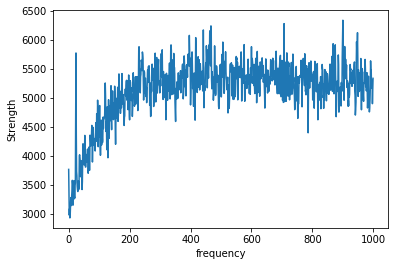

In [74]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun_26.00.lammpstrj',5200,14000,15000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]  
yvelocities=velocities[:,0:400,1]
yvelocities=np.swapaxes(yvelocities,0,1)

i=yvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in yvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real
import matplotlib.pyplot as plt
plt.plot(PSD_sum[0:1000])

plt.xlabel('frequency')
plt.ylabel('Strength')

plt.savefig('Under_electric_field.png')

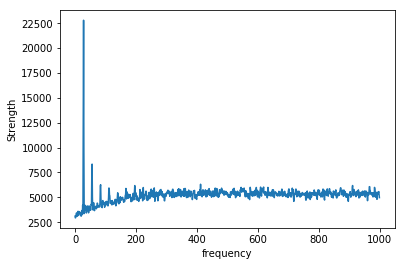

In [75]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun_27.00.lammpstrj',5200,14000,15000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]  
yvelocities=velocities[:,0:400,1]
yvelocities=np.swapaxes(yvelocities,0,1)

i=yvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in yvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real
import matplotlib.pyplot as plt
plt.plot(PSD_sum[0:1000])

plt.xlabel('frequency')
plt.ylabel('Strength')

plt.savefig('Under_electric_field.png')

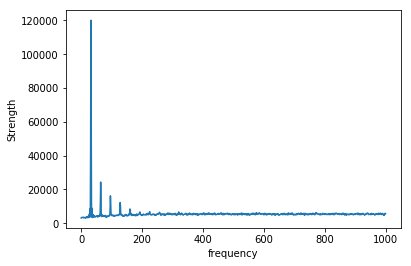

In [78]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun_28.00.lammpstrj',5200,14000,15000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]  
yvelocities=velocities[:,0:400,1]
yvelocities=np.swapaxes(yvelocities,0,1)

i=yvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in yvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real
import matplotlib.pyplot as plt
plt.plot(PSD_sum[0:1000])

plt.xlabel('frequency')
plt.ylabel('Strength')

plt.savefig('Under_electric_field.png')

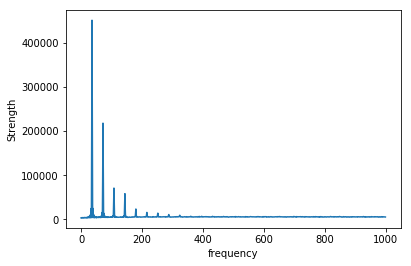

In [79]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun_29.00.lammpstrj',5200,14000,15000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]  
yvelocities=velocities[:,0:400,1]
yvelocities=np.swapaxes(yvelocities,0,1)

i=yvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in yvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real
import matplotlib.pyplot as plt
plt.plot(PSD_sum[0:1000])

plt.xlabel('frequency')
plt.ylabel('Strength')

plt.savefig('Under_electric_field.png')

In [102]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun_detail.01.lammpstrj',5200,9000,10000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2] 
yvelocities=velocities[:,0:400,1]
yvelocities=np.swapaxes(yvelocities,0,1)

i=yvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in yvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real
f=open("e0.01_y_PSD.txt",'w')
for i in PSD_sum:
    f.write("%f\n"%(i))
f.close()
xvelocities=velocities[:,0:400,0]
xvelocities=np.swapaxes(xvelocities,0,1)

i=xvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in xvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real
f=open("e0.01_x_PSD.txt",'w')
for i in PSD_sum:
    f.write("%f\n"%(i))
f.close()

In [103]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun_detail1.00.lammpstrj',5200,9000,10000)


velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2] 
yvelocities=velocities[:,0:400,1]
yvelocities=np.swapaxes(yvelocities,0,1)

i=yvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in yvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real
f=open("e1_y_PSD.txt",'w')
for i in PSD_sum:
    f.write("%f\n"%(i))
f.close()
xvelocities=velocities[:,0:400,0]
xvelocities=np.swapaxes(xvelocities,0,1)

i=xvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in xvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real
f=open("e1_x_PSD.txt",'w')
for i in PSD_sum:
    f.write("%f\n"%(i))
f.close()

In [104]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun_detail10.00.lammpstrj',5200,9000,10000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2] 
yvelocities=velocities[:,0:400,1]
yvelocities=np.swapaxes(yvelocities,0,1)

i=yvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in yvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real
f=open("e10_y_PSD.txt",'w')
for i in PSD_sum:
    f.write("%f\n"%(i))
f.close()
xvelocities=velocities[:,0:400,0]
xvelocities=np.swapaxes(xvelocities,0,1)

i=xvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in xvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real
f=open("e10_x_PSD.txt",'w')
for i in PSD_sum:
    f.write("%f\n"%(i))
f.close()

In [105]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun_detail8.00.lammpstrj',5200,9000,10000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2] 
yvelocities=velocities[:,0:400,1]
yvelocities=np.swapaxes(yvelocities,0,1)

i=yvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in yvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real
f=open("e8_y_PSD.txt",'w')
for i in PSD_sum:
    f.write("%f\n"%(i))
f.close()
xvelocities=velocities[:,0:400,0]
xvelocities=np.swapaxes(xvelocities,0,1)

i=xvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in xvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real
f=open("e8_x_PSD.txt",'w')
for i in PSD_sum:
    f.write("%f\n"%(i))
f.close()

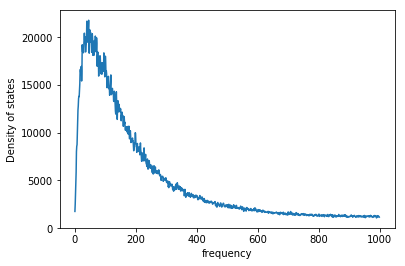

In [97]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun_detail1.00.lammpstrj',5200,9000,10000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]  
yvelocities=velocities[:,0:400,1]
yvelocities=np.swapaxes(yvelocities,0,1)

i=yvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in yvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real

import matplotlib.pyplot as plt
plt.plot(PSD_sum[0:1000])

plt.xlabel('frequency')
plt.ylabel('Density of states')

plt.savefig('Under_electric_field_e0.01.png')

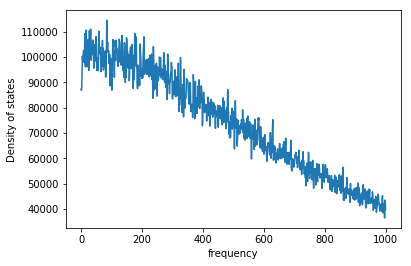

In [154]:
a=read_lammpstrj('electric_field_langevin_large_small_att_norm_longrun_equil.01.lammpstrj',5200,5000,10000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]  
yvelocities=velocities[:,0:400,1]
yvelocities=np.swapaxes(yvelocities,0,1)

i=yvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in yvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real
f=open("norm_e0.01_y_PSD.txt",'w')
for i in PSD_sum:
    f.write("%f\n"%(i))
f.close()
xvelocities=velocities[:,0:400,0]
xvelocities=np.swapaxes(xvelocities,0,1)

i=xvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in xvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real
f=open("norm_e0.01_x_PSD.txt",'w')
for i in PSD_sum:
    f.write("%f\n"%(i))
f.close()
import matplotlib.pyplot as plt
plt.plot(PSD_sum[0:1000])

plt.xlabel('frequency')
plt.ylabel('Density of states')

plt.savefig('Under_electric_field_e0.01.png')

In [141]:
sinf=np.sin(np.array(list(range(1,361))) * np.pi / 180. )


In [130]:
F = np.fft.fft(sinf, n=2*len(sinf))  #2*N because of zero-padding


In [146]:
t = np.arange(256)
freq = np.fft.fftfreq(t.shape[-1])


In [148]:
t.shape[-1]

256

In [147]:
freq

array([ 0.        ,  0.00390625,  0.0078125 ,  0.01171875,  0.015625  ,
        0.01953125,  0.0234375 ,  0.02734375,  0.03125   ,  0.03515625,
        0.0390625 ,  0.04296875,  0.046875  ,  0.05078125,  0.0546875 ,
        0.05859375,  0.0625    ,  0.06640625,  0.0703125 ,  0.07421875,
        0.078125  ,  0.08203125,  0.0859375 ,  0.08984375,  0.09375   ,
        0.09765625,  0.1015625 ,  0.10546875,  0.109375  ,  0.11328125,
        0.1171875 ,  0.12109375,  0.125     ,  0.12890625,  0.1328125 ,
        0.13671875,  0.140625  ,  0.14453125,  0.1484375 ,  0.15234375,
        0.15625   ,  0.16015625,  0.1640625 ,  0.16796875,  0.171875  ,
        0.17578125,  0.1796875 ,  0.18359375,  0.1875    ,  0.19140625,
        0.1953125 ,  0.19921875,  0.203125  ,  0.20703125,  0.2109375 ,
        0.21484375,  0.21875   ,  0.22265625,  0.2265625 ,  0.23046875,
        0.234375  ,  0.23828125,  0.2421875 ,  0.24609375,  0.25      ,
        0.25390625,  0.2578125 ,  0.26171875,  0.265625  ,  0.26

In [142]:
F = np.fft.fft(sinf, n=len(sinf))  #2*N because of zero-padding


In [143]:
PSD = F * F.conjugate()

In [144]:
F

array([-2.99863620e-15+0.00000000e+00j,  3.14143316e+00-1.79972585e+02j,
        1.57840994e-16-1.04024624e-14j, -3.30078435e-16-7.37731865e-15j,
        1.70544133e-15-4.10533238e-15j,  8.17043252e-16-6.67821109e-15j,
        4.97858312e-16-1.03348876e-15j,  2.66453526e-15-3.99680289e-15j,
       -1.34869922e-15-1.60202239e-15j,  9.76217793e-16+2.63977066e-15j,
       -1.50836692e-16-1.82000126e-15j, -6.95307269e-17-9.21402793e-16j,
        9.74959067e-16-1.49932717e-15j,  2.19514633e-15-3.14391973e-15j,
        1.36726522e-15-2.04652524e-15j, -1.56983484e-15+9.80446304e-16j,
        1.98090937e-15-2.02027517e-15j, -1.21257033e-15-4.19361777e-16j,
        5.28025681e-16-2.17954816e-16j, -1.90842768e-16-3.83905978e-15j,
       -1.65672639e-16+1.33059879e-15j, -2.21623159e-15+3.14128455e-15j,
       -8.38413588e-16+2.41528952e-16j,  5.74540415e-15+1.02140518e-14j,
        1.22503219e-15-8.79454320e-16j,  8.16988662e-15+1.45078608e-15j,
        1.03554271e-15+1.45697088e-15j,  3.28528872

/home/dw/anaconda3/lib/python3.7/site-packages/numpy/core/_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


Text(0, 0.5, 'Density of states')

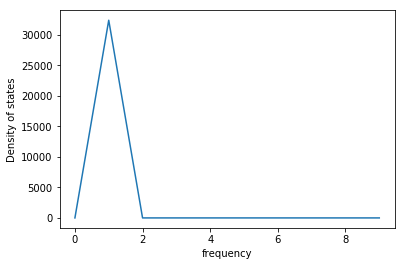

In [145]:
import matplotlib.pyplot as plt
plt.plot(PSD[0:10])

plt.xlabel('frequency')
plt.ylabel('Density of states')

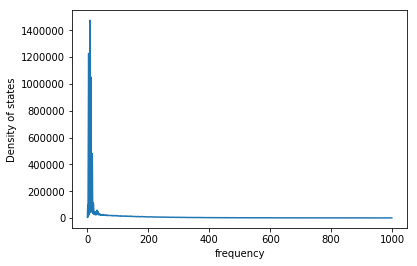

In [100]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun_detail10.00.lammpstrj',5200,9000,10000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]  
yvelocities=velocities[:,0:400,1]
yvelocities=np.swapaxes(yvelocities,0,1)

i=yvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in yvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real
import matplotlib.pyplot as plt
plt.plot(PSD_sum[0:1000])

plt.xlabel('frequency')
plt.ylabel('Density of states')

plt.savefig('Under_electric_field_e0.01.png')

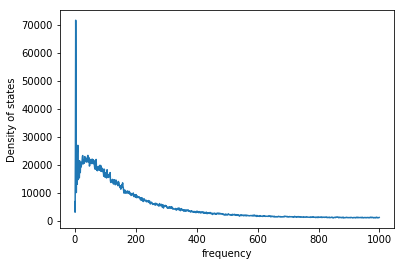

In [101]:
a=read_lammpstrj('electric_field_langevin_large_small_att_spring_longrun_detail8.00.lammpstrj',5200,9000,10000)
positions=a.positions
small_positions=a.positions[:,400:5200,0:2]
large_positions=a.positions[:,0:400,0:2]
velocities=a.velocities
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,0:400,0:2]
vxsmall_set=[]  
yvelocities=velocities[:,0:400,1]
yvelocities=np.swapaxes(yvelocities,0,1)

i=yvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in yvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real
import matplotlib.pyplot as plt
plt.plot(PSD_sum[0:1000])

plt.xlabel('frequency')
plt.ylabel('Density of states')

plt.savefig('Under_electric_field_e0.01.png')

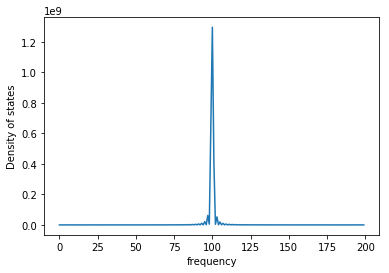

In [91]:
plt.plot(PSD_sum[0:200])

plt.xlabel('frequency')
plt.ylabel('Density of states')

plt.savefig('Under_electric_field_e0.01.png')

In [87]:
f=open("e0.01_y_PSD.txt",'w')
for i in PSD_sum:
    f.write("%f\n"%(i))
f.close()

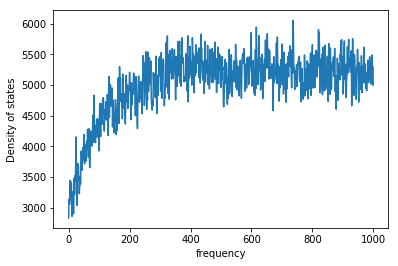

In [88]:
xvelocities=velocities[:,0:400,0]
xvelocities=np.swapaxes(xvelocities,0,1)

i=xvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in xvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real
import matplotlib.pyplot as plt
plt.plot(PSD_sum[0:1000])

plt.xlabel('frequency')
plt.ylabel('Density of states')

plt.savefig('Under_electric_field_e0.01.png')
f=open("e0.01_x_PSD.txt",'w')
for i in PSD_sum:
    f.write("%f\n"%(i))
f.close()

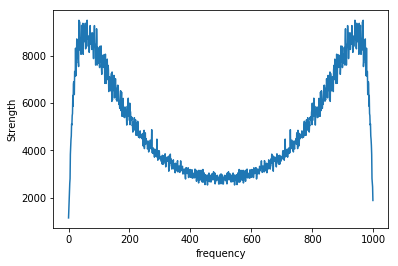

In [62]:
i=yvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=N)  #2*N because of zero-padding
PSD_1= F * F.conjugate()
PSD_sum_1=PSD_1.real
for i in yvelocities:
    N=len(i)
    F = np.fft.fft(i, n=N)  #2*N because of zero-padding
    PSD_1= F * F.conjugate()
    PSD_sum_1+=PSD_1.real
import matplotlib.pyplot as plt
plt.plot(PSD_sum_1[0:1000])

plt.xlabel('frequency')
plt.ylabel('Strength')

plt.savefig('Under_electric_field.png')

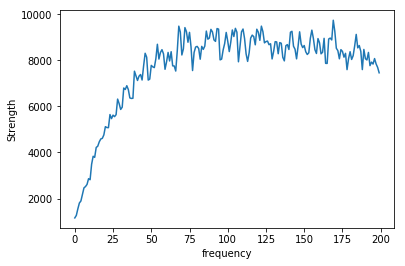

In [55]:
plt.plot(PSD_sum[0:200])

plt.xlabel('frequency')
plt.ylabel('Strength')

plt.savefig('Under_electric_field.png')

In [44]:
yvelocities=np.swapaxes(yvelocities,0,1)

i=yvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in yvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real

In [70]:
freq=1/10
data_size=1000
data = [np.sin(2 * np.pi * freq * (x))
            for x in range(data_size)]


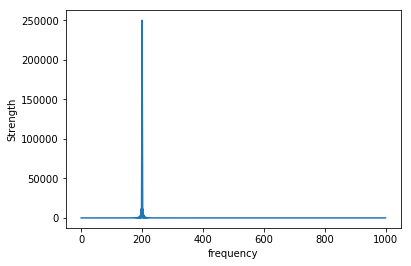

In [71]:
F = np.fft.fft(data, n=2*data_size)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real
import matplotlib.pyplot as plt
plt.plot(PSD_sum[0:1000])

plt.xlabel('frequency')
plt.ylabel('Strength')

plt.savefig('Under_electric_field.png')

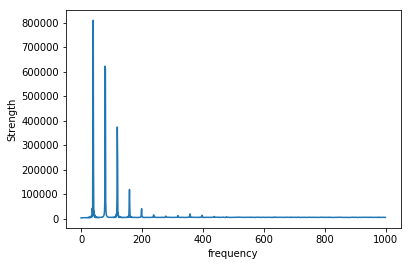

In [46]:
import matplotlib.pyplot as plt
plt.plot(PSD_sum[0:1000])

plt.xlabel('frequency')
plt.ylabel('Strength')

plt.savefig('Under_electric_field.png')

In [20]:
small_velocities[2*100:3*100+900,:,0]

array([[ 1.92945  ,  1.53235  ,  2.91784  , ...,  3.62387  ,  1.11766  ,
         2.38883  ],
       [-2.37882  ,  3.19712  ,  2.36583  , ..., -2.11452  ,  1.43815  ,
         1.58818  ],
       [-0.833372 ,  3.56135  ,  1.19873  , ...,  5.42108  ,  6.55761  ,
         0.25268  ],
       ...,
       [-0.946657 , -0.0350999,  1.42494  , ...,  2.76731  ,  3.37324  ,
         2.04334  ],
       [ 9.74313  ,  1.79564  , -2.64538  , ...,  5.24086  ,  3.62291  ,
         3.37564  ],
       [ 5.3966   ,  3.34732  ,  2.4936   , ...,  0.250491 ,  3.98024  ,
        -0.121054 ]])

In [21]:
small_velocities.shape

(1001, 4800, 2)

In [24]:
small_velocities[300:1200].shape

(701, 4800, 2)

In [14]:
velocities.shape

(9901, 5200, 3)

In [17]:
positions=a.positions

In [18]:
small_positions=a.positions[:,400:5200,0:2]

In [19]:
large_positions=a.positions[:,0:400,0:2]

In [20]:
velocities=a.velocities

In [21]:
small_velocities=velocities[:,400:5200,0:2]
large_velocities=velocities[:,400:5200,0:2]

In [66]:
small_velocities[3000:4000,:,0].mean()

16.43807598690464

In [67]:
box_size=a.box_size
box_size

array([[900. , 779.4,   1. ],
       [900. , 779.4,   1. ],
       [900. , 779.4,   1. ],
       ...,
       [900. , 779.4,   1. ],
       [900. , 779.4,   1. ],
       [900. , 779.4,   1. ]])

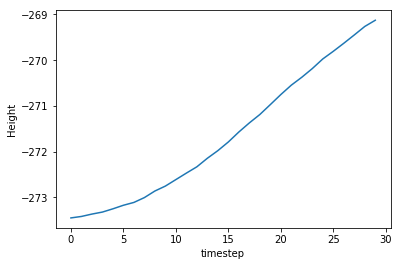

In [69]:
plt.plot(large_positions[2821:2851,53,1])
plt.xlabel('timestep')
plt.ylabel('Height')

plt.savefig('particle_displacement.png')

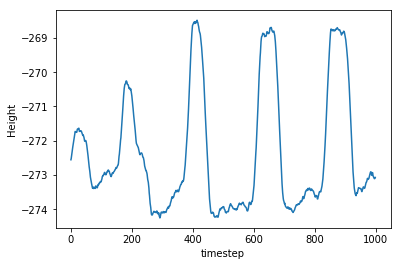

In [70]:
plt.plot(large_positions[2000:3000,53,1])
plt.xlabel('timestep')
plt.ylabel('Height')

plt.savefig('particle_displacement.png')

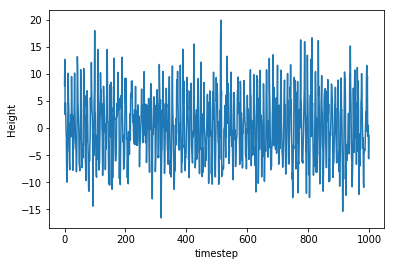

In [71]:
plt.plot(large_velocities[2000:3000,53,1])
plt.xlabel('timestep')
plt.ylabel('Height')

plt.savefig('particle_velocities.png')

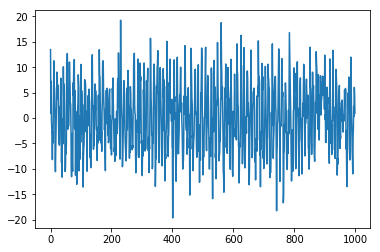

In [68]:
plt.plot(large_velocities[3000:4000,53,1])

In [111]:
bin_size=10
bin_number=box_size/bin_size

In [112]:
bin_number

array([[90.  , 77.94,  0.1 ],
       [90.  , 77.94,  0.1 ],
       [90.  , 77.94,  0.1 ],
       ...,
       [90.  , 77.94,  0.1 ],
       [90.  , 77.94,  0.1 ],
       [90.  , 77.94,  0.1 ]])

In [110]:
small_positions[3000]

array([[-351.44 , -366.482],
       [-132.438, -367.051],
       [-369.575, -367.905],
       ...,
       [-271.558,  334.58 ],
       [ 294.7  ,  297.062],
       [ 110.88 ,  370.944]])

In [225]:
histogram=np.histogram2d(small_positions[3000,:,0],small_positions[3000,:,1],bins=[90*2,78*2])

In [278]:
for i in range(2000,3000,100):
    histogram=np.histogram2d(small_positions[i,:,0],small_positions[i,:,1],bins=[90*2,78*2])
    x_bins=np.digitize(small_positions[i,:,0],histogram[1],right=True)
    y_bins=np.digitize(small_positions[i,:,1],histogram[2],right=True)
    v_bins=np.zeros((90*2,78*2+1,3))
    for j in range(0,4800):
        v_bins[x_bins[j]-1][y_bins[j]-1][0]+=small_velocities[3000,j,0]
        v_bins[x_bins[j]-1][y_bins[j]-1][1]+=small_velocities[3000,j,1]
        v_bins[x_bins[j]-1][y_bins[j]-1][2]+=1
    for k in v_bins:
        for l in k:
            if l[2]>0:
                l[0]=l[0]/l[2]
                l[1]=l[1]/l[2]
    v_bins=np.swapaxes(v_bins,0,1)
    plt.figure(dpi=2000)

    sns.heatmap(v_bins[:,:,0],cmap='viridis')

    plt.savefig('velocity_map_%f.png'%(i))
 


In [280]:
v_ave=[]
for i in range(2000,3000,100):
    v_ave.append(np.average(small_velocities[i,:,0]))

In [281]:
v_ave

[17.429783850666666,
 17.1837118255625,
 16.995180795041666,
 16.6823874705625,
 16.47473617525,
 16.236920003604165,
 16.139597690079167,
 16.153299204499998,
 16.19799079795833,
 16.126754780645832]

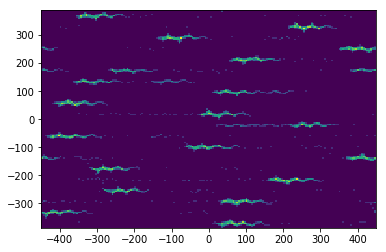

In [279]:
for i in range(2000,3000,100):
    plt.hist2d(small_positions[i,:,0],small_positions[i,:,1],bins=[90*2,78*2])
    plt.savefig('density_map_%f.png'%(i),dpi=2000)

In [226]:
histogram[0]

array([[0., 0., 5., ..., 0., 0., 0.],
       [0., 0., 4., ..., 0., 0., 0.],
       [0., 0., 2., ..., 0., 0., 0.],
       ...,
       [2., 5., 5., ..., 0., 0., 0.],
       [3., 5., 4., ..., 0., 0., 0.],
       [0., 2., 5., ..., 0., 0., 0.]])

In [227]:
histogram[2]

array([-384.436     , -379.52887821, -374.62175641, -369.71463462,
       -364.80751282, -359.90039103, -354.99326923, -350.08614744,
       -345.17902564, -340.27190385, -335.36478205, -330.45766026,
       -325.55053846, -320.64341667, -315.73629487, -310.82917308,
       -305.92205128, -301.01492949, -296.10780769, -291.2006859 ,
       -286.2935641 , -281.38644231, -276.47932051, -271.57219872,
       -266.66507692, -261.75795513, -256.85083333, -251.94371154,
       -247.03658974, -242.12946795, -237.22234615, -232.31522436,
       -227.40810256, -222.50098077, -217.59385897, -212.68673718,
       -207.77961538, -202.87249359, -197.96537179, -193.05825   ,
       -188.15112821, -183.24400641, -178.33688462, -173.42976282,
       -168.52264103, -163.61551923, -158.70839744, -153.80127564,
       -148.89415385, -143.98703205, -139.07991026, -134.17278846,
       -129.26566667, -124.35854487, -119.45142308, -114.54430128,
       -109.63717949, -104.73005769,  -99.8229359 ,  -94.91581

In [262]:
x_bins=np.digitize(small_positions[3000,:,0],histogram[1],right=True)
y_bins=np.digitize(small_positions[3000,:,1],histogram[2],right=True)

In [263]:
x_bins.shape

(4800,)

In [264]:
test=np.digitize([500],histogram[1])

In [265]:
test

array([181])

In [266]:
max(y_bins)

156

In [267]:
v_bins=np.zeros((90*2,78*2+1,3))

In [268]:
for i in range(0,4800):
    v_bins[x_bins[i]-1][y_bins[i]-1][0]+=small_velocities[3000,i,0]
    v_bins[x_bins[i]-1][y_bins[i]-1][1]+=small_velocities[3000,i,1]
    v_bins[x_bins[i]-1][y_bins[i]-1][2]+=1
for i in v_bins:
    for j in i:
        if j[2]>0:
            j[0]=j[0]/j[2]
            j[1]=j[1]/j[2]


In [269]:
min(v_bins.flat)

-19.145

In [270]:
v_bins=np.swapaxes(v_bins,0,1)

In [272]:
plt.figure(dpi=2000)

sns.heatmap(v_bins[:,:,0],cmap='viridis')
i=3000
plt.savefig('velocity_map_%f.png'%(i))

In [120]:
A = np.random.randint(0, 100, 10)

bins = np.array([0., 20., 40., 60., 80., 100.])

# d is an index array holding the bin id for each point in A
d = np.digitize(A, bins)   

In [121]:
A

array([92,  8, 67, 66, 68, 46, 16, 13, 58, 51])

In [122]:
d

array([5, 1, 4, 4, 4, 3, 1, 1, 3, 3])

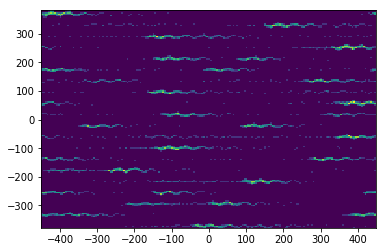

In [274]:
plt.hist2d(small_positions[2000,:,0],small_positions[2000,:,1],bins=[90*2,78*2])
plt.savefig('density_map_%f.png'%(2000),dpi=2000)

In [40]:
yvelocities=a.velocities[3000:4000,0:400,1]

In [28]:
xvelocities=a.velocities[0:3000,0:400,0]

In [39]:
np.average(xvelocities)

19.90146097191042

In [30]:
xvelocities=np.swapaxes(xvelocities,0,1)

i=xvelocities[1,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in xvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real

In [41]:
yvelocities=np.swapaxes(yvelocities,0,1)

i=yvelocities[0,:]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real

for i in yvelocities:
    N=len(i)
    F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
    PSD = F * F.conjugate()
    PSD_sum+=PSD.real

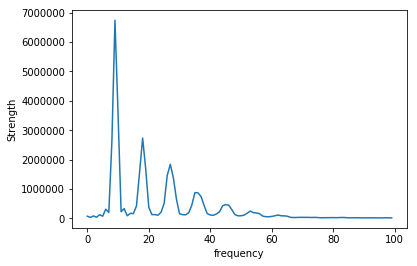

In [57]:
import matplotlib.pyplot as plt
plt.plot(PSD_sum[0:100])

plt.xlabel('frequency')
plt.ylabel('Strength')

plt.savefig('Under_electric_field.png')

In [45]:
PSD_sum[0:100]

array([  73467.58419467,   30794.63463578,   82110.81083589,
         38071.42661028,  123113.97287296,   72114.65229242,
        311775.2951816 ,  199018.15989999, 2619013.2937014 ,
       6742536.67989378, 3572447.18222702,  225755.33161422,
        331772.01032313,   87806.84421328,  168345.562194  ,
        161875.54841967,  424959.62778858, 1560581.90593877,
       2732758.14089734, 1680336.74391328,  379227.04124514,
        127317.95970183,  127372.01714904,  107204.28187367,
        207661.47258546,  511545.23063386, 1462382.38426726,
       1839162.18571125, 1379430.46280481,  651050.26641376,
        155883.73305845,  126212.47212063,  119338.13800845,
        193295.41905663,  447979.73555164,  876969.36609775,
        868170.80367618,  742548.89433417,  436367.36941625,
        163100.8875078 ,  113712.20378106,  104077.87432815,
        148352.60651063,  223436.7225743 ,  424481.43917889,
        468930.47736275,  449513.99007499,  299308.84739649,
        130186.89558181,

In [63]:
t = np.arange(256)
sp = np.fft.fft(np.sin(t),n=256*2)
psd=sp*sp.conjugate()

/home/dw/anaconda3/lib/python3.7/site-packages/numpy/core/_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


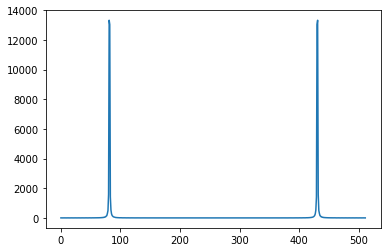

In [64]:
plt.plot(psd)

In [62]:
psd[40:50]

array([1.59015355e+03+0.j, 1.30504641e+04+0.j, 5.29908339e+02+0.j,
       1.60286728e+02+0.j, 7.51033106e+01+0.j, 4.29116227e+01+0.j,
       2.74741381e+01+0.j, 1.89411224e+01+0.j, 1.37554982e+01+0.j,
       1.03826748e+01+0.j])

In [40]:
N

3000

In [8]:
np.average(xvelocities)

-3.5669275177951933e-12

In [14]:
yvelocities=a.velocities[0:1000,2000:26000,1]
np.average(yvelocities)

0.0005011218265328808

In [68]:
exvelocities=exvelocities.flatten()

(array([1.000e+00, 0.000e+00, 2.000e+00, 4.000e+00, 0.000e+00, 0.000e+00,
        1.000e+00, 2.000e+00, 4.000e+00, 7.000e+00, 4.000e+00, 4.000e+00,
        1.500e+01, 1.400e+01, 1.400e+01, 2.800e+01, 3.500e+01, 4.500e+01,
        4.600e+01, 6.000e+01, 8.900e+01, 1.050e+02, 1.290e+02, 1.830e+02,
        1.960e+02, 2.490e+02, 2.910e+02, 3.510e+02, 3.870e+02, 3.910e+02,
        5.210e+02, 5.760e+02, 6.490e+02, 6.990e+02, 8.360e+02, 9.140e+02,
        9.810e+02, 1.074e+03, 1.141e+03, 1.232e+03, 1.251e+03, 1.452e+03,
        1.479e+03, 1.511e+03, 1.583e+03, 1.601e+03, 1.631e+03, 1.702e+03,
        1.752e+03, 1.595e+03, 1.657e+03, 1.542e+03, 1.579e+03, 1.541e+03,
        1.412e+03, 1.370e+03, 1.320e+03, 1.115e+03, 1.135e+03, 1.027e+03,
        9.230e+02, 8.640e+02, 7.590e+02, 7.260e+02, 6.290e+02, 5.250e+02,
        4.720e+02, 4.170e+02, 3.560e+02, 3.190e+02, 2.700e+02, 2.320e+02,
        2.110e+02, 1.660e+02, 1.280e+02, 1.080e+02, 6.100e+01, 7.000e+01,
        5.600e+01, 5.400e+01, 2.800e+0

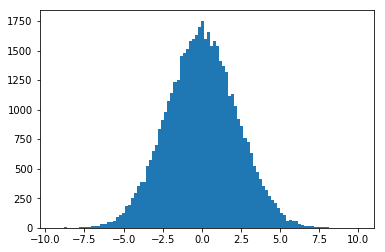

In [69]:
plt.hist(exvelocities,bins=100)

In [13]:
a.velocities

array([[[ 0.00000e+00,  0.00000e+00,  0.00000e+00],
        [ 0.00000e+00,  0.00000e+00,  0.00000e+00],
        [ 0.00000e+00,  0.00000e+00,  0.00000e+00],
        ...,
        [ 0.00000e+00,  0.00000e+00,  0.00000e+00],
        [ 0.00000e+00,  0.00000e+00,  0.00000e+00],
        [ 0.00000e+00,  0.00000e+00,  0.00000e+00]],

       [[-1.20208e-01, -1.07457e-02, -8.85979e-03],
        [-4.39132e-03, -7.18574e-03, -2.44551e-04],
        [-2.13284e-01, -4.59700e-02,  5.43428e-04],
        ...,
        [-1.76476e+00,  2.53173e+00, -1.24602e-01],
        [-3.16482e+00,  2.95223e+00,  4.73779e-02],
        [-3.86259e+00, -4.45873e+00,  1.33294e-01]],

       [[-6.82369e-02,  5.39500e-03, -8.52933e-03],
        [ 5.43124e-02,  1.29020e-01, -8.78177e-03],
        [-1.87436e-01,  1.30700e-01,  8.53146e-03],
        ...,
        [ 3.36514e+00,  9.73237e-01, -9.18081e-02],
        [-7.79912e-02, -1.60040e+00, -1.77494e-01],
        [ 2.29332e+00,  9.63147e-01,  1.56151e-02]],

       ...,

      

In [63]:
vearray=np.array(a.velocities[0:200])
vearray=np.swapaxes(vearray,0,1)
velarge=vearray[0:400]
vesmall=vearray[400:]
vnarray=np.array(a.velocities[200:])
vnarray=np.swapaxes(vnarray,0,1)
vnlarge=vnarray[0:400]
vnsmall=vnarray[400:]

count=0
eley=0
for i in range(0,400):
    for j in range(0,200):
        count+=1
        eley+=(velarge[i][j][1])**2
tley=eley/count
elny=0
count=0
for i in range(0,400):
    for j in range(0,2000):
        count+=1
        elny+=(vnlarge[i][j][1])**2
tlny=elny/count
count=0
elex=0
for i in range(0,400):
    for j in range(0,200):
        count+=1
        elex+=(velarge[i][j][0])**2
tlex=elex/count
elnx=0
count=0
for i in range(0,400):
    for j in range(0,2000):
        count+=1
        elnx+=(vnlarge[i][j][0])**2
tlnx=elnx/count
esey=0
count=0
for i in range(0,4800):
    for j in range(0,200):
        count+=1
        esey+=(vesmall[i][j][1])**2
tsey=esey/count
esex=0
count=0
for i in range(0,4800):
    for j in range(0,200):
        count+=1
        esex+=(vesmall[i][j][0])**2
tsex=esex/count


In [64]:
vsnx=0
count=0
for i in range(0,4800):
    for j in range(0,2000):
        count+=1
        vsnx+=(vnsmall[i][j][0])
vsnx_average=vsnx/count

In [65]:
vsex=0
count=0
for i in range(0,4800):
    for j in range(0,200):
        count+=1
        vsex+=(vesmall[i][j][0])
vsex_average=vsex/count

In [66]:
vsnx_average

9.502089273296864

In [54]:
tlnx

0.012509904734157721

In [23]:
velarge

array([[[ 0.        ,  0.        ,  0.        ],
        [-0.0209518 , -0.0372832 ,  0.        ],
        [-0.0455249 , -0.0085156 ,  0.        ],
        ...,
        [-0.0282453 , -0.0968218 ,  0.        ],
        [ 0.0309065 , -0.0151037 ,  0.        ],
        [ 0.0231987 , -0.0186509 ,  0.        ]],

       [[ 0.        ,  0.        ,  0.        ],
        [ 0.0278087 ,  0.0244357 ,  0.        ],
        [ 0.0244803 ,  0.0640127 ,  0.        ],
        ...,
        [ 0.0845195 ,  0.0718655 ,  0.        ],
        [ 0.0454012 , -0.0163588 ,  0.        ],
        [ 0.00107013,  0.0440818 ,  0.        ]],

       [[ 0.        ,  0.        ,  0.        ],
        [-0.0260924 ,  0.0474549 ,  0.        ],
        [-0.0172058 ,  0.0257557 ,  0.        ],
        ...,
        [-0.108047  , -0.00271505,  0.        ],
        [ 0.0532521 ,  0.0427759 ,  0.        ],
        [ 0.02918   ,  0.015181  ,  0.        ]],

       ...,

       [[ 0.        ,  0.        ,  0.        ],
        [ 0

In [21]:
ex/count

4168.096712374677

In [33]:
ez/count

0.0

In [14]:
varray=np.array(a.velocities[800:])
varray=np.swapaxes(varray,0,1)
parray=np.array(a.positions[800:])
parray=np.swapaxes(parray,0,1)
count1=0
count2=0
e1=0
e2=0
for i in range(0,5200):
    for j in range(0,4000):
        if parray[i][j][0]>-450 and parray[i][j][0]<-360:
            count1+=1
            e1+=varray[i][j][0]**2+varray[i][j][1]**2
        else:
            if parray[i][j][0]>360 and parray[i][j][0]<450:
                count1+=1
                e1+=varray[i][j][0]**2+varray[i][j][1]**2
            else:
                count2+=1
                e2+=varray[i][j][0]**2+varray[i][j][1]**2


In [15]:
t1=e1/count1
t2=e2/count2

In [17]:
t2

2.8526251846303516

In [8]:
parray.shape

(5200, 4001, 3)

In [ ]:
for i in range(0,5200)

In [28]:
for line in f:
        n_t=int(count/(N_particles+9))
        if n_t<N_start:
            count+=1varray=np.array(a.velocities[800:])
varray=np.swapaxes(varray,0,1)
varray=varray[0:10]
i=varray[1,:,0]
N=len(i)
F = np.fft.fft(i, n=2*N)  #2*N because of zero-padding
PSD = F * F.conjugate()
PSD_sum=PSD.real
for j in range(0,3):
    for i in varray:
        N=len(i[:,j])
        F = np.fft.fft(i[:,j], n=2*N)  #2*N because of zero-padding
        PSD = F * F.conjugate()
        PSD_sum+=PSD.real

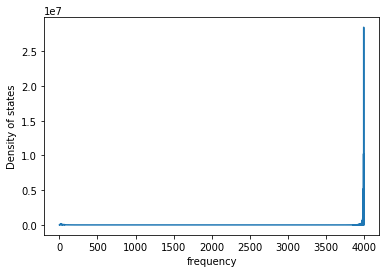

In [29]:
import matplotlib.pyplot as plt
plt.plot(PSD_sum[0:4000])

plt.xlabel('frequency')
plt.ylabel('Density of states')

plt.savefig('vibrate_wall_1.png')

In [40]:
a=read_lammpstrj('hexagonal_spring1.5.lammpstrj',400)

In [ ]:
import matplotlib.pyplot as plt
